# Projet Vuvuzela S4

In [1]:
import vuvuzela as lib #bibliothèque personnelle

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
from scipy.io import wavfile # scipy library to read wav files
#Definition des paramètres généraux
AudioName = "vuvuzela.wav" # Audio File
rate, data = wavfile.read(AudioName)

In [3]:
import IPython.display as ipd
ipd.Audio("vuvuzela.wav")

## Analyse spectrale

### Question 1. En utilisant matplotlib, représentez le contenu temporel puis fréquentiel de l’enregistrement sonore.

#### Analyse temporelle du son complet

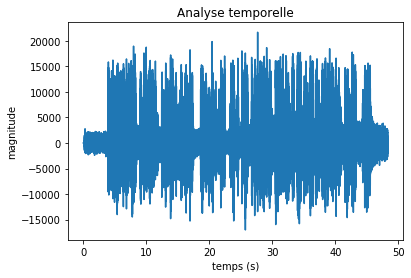

In [4]:
lib.temporel(rate,data)

On observe le son en entier et on s'aperçoit qu'au tout début du son on peut isoler un moment où il y a seulement le vuvuzela comme bruit.

####  Analyse fréquentielle du son complet

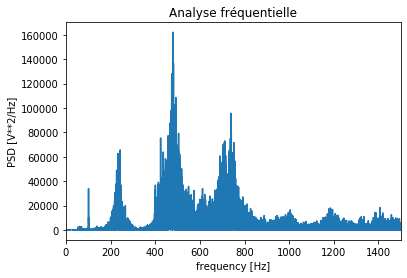

In [5]:
lib.frequentiel(rate,data)

Ici les fréquences du vuvuzela et la fréquence du commentateur se mélange, c'est inexploitable.

### Question 2. Isolez une portion temporelle de l’enregistrement sonore ne contenant que des sonorités de Vuvuzela (pas de commentaires sportifs). Représentez alors le contenu fréquentiel de cette portion.

#### Analyse temporelle du son tronqué

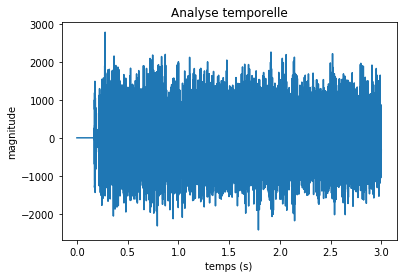

In [6]:
data_trunc = lib.trunc(rate,data)
lib.temporel(rate,data_trunc)

Ces 3 premières secondes mette en effet en avant le moment ou le vuvuzela est joué, il est donc intéressant à partir de maintenant d'étudier cette partie.

#### Analyse fréquentielle du son tronqué

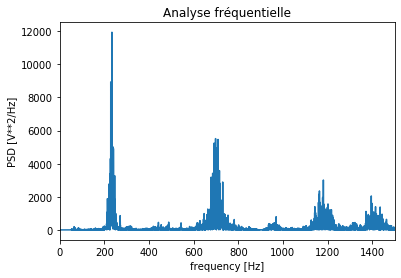

In [7]:
lib.frequentiel(rate,data_trunc)

On observe clairement les fréquences caractéristiques du vuvuzela.

### Question 3. Identifiez les composantes fréquentielles du son de Vuvuzela c-a-d les valeurs de fk (k = 1; ... ;L). Retrouvez alors l’unique note de la gamme tempérée qu’est capable de générer le Vuvuzela.

L'analyse fréquentielle nous permet d'identifier 4 harmoniques caractéristiques du son qu'émet le vuvuzela.

####  Détermination des fréquences des harmoniques que nous voulons rejeter

On a la fréquence fondamentale : $f_0 = 235Hz $

Alors les harmoniques sont :    $$f_1 = 2f_0 = 470Hz$$
                                $$f_2 = 3f_0 = 705Hz$$
                                $$f_3 = 4f_0 = 940Hz$$
                                $$f_4 = 5f_0 = 1175Hz$$
                                $$f_5 = 6f_0 = 1410Hz$$
        
En analysant le fréquentiel obtenu juste au dessus on arrive à identifier les fréqences que nous voulons rejeter : $ f_0 , f_2 , f_4 , f_5 $

## Rejecteur / filtre "Notch"

Nous allons rejeter ces 4 fréquences caractéristiques grâce à 4 rejecteurs en série. Ces 4 rejecteurs se différencieront par $\omega_0$ 

Pour réaliser ces filtres, nous fixons $T_0 = 1$. Concernant le $m$, celui_ci est subjectif, il permet de donner une marge de suppression, si $m$ est trop élevé : risque de supprimer les sons du commentateur sportif. Si $m$ est trop petit : trop sélectif.

### Question 5. Déterminez la fonction de transfert T(p) de ce rejecteur.

On détermine la fonction de transfert : $$T=\frac{1+LCp^2}{1+RCp+LCp^2}$$

In [8]:
transfert = lib.transfert_function(235, 0.5, 1) #exemple à la fréquence fondamentale

###  Question 6. Déterminez l’expression du coefficient d’amortissement m et de la pulsation propre !0 en fonction des différents composants du filtre.

L'expression du coefficient d’amortissement est: $$m = \frac{R\sqrt{C}}{2\sqrt{L}}$$

L'expression de la pulsation propre est: $$\omega_0= \frac{1}{\sqrt{LC}}$$

### Question 7. A partir d’une analyse théorique, déterminez les pôles et les zeros de ce filtre. Montrez ensuite que ce filtre permet de supprimer complètement une composante fréquentielle f particulière (expression de f à déterminer). Déterminez théoriquement l’expression de la largeur de la bande rejetée à -3dB, puis l’expression du gain en basse-et haute fréquence de ce filtre.

Le zéro de ce filtre vaut $$\frac{j}{\sqrt{LC}}$$

Les pôles de ce filtre sont:
$$p1 = \frac{-RC-\sqrt{R^2C^2-4LC}}{2LC}$$
$$p2 = \frac{-RC+\sqrt{R^2C^2-4LC}}{2LC}$$

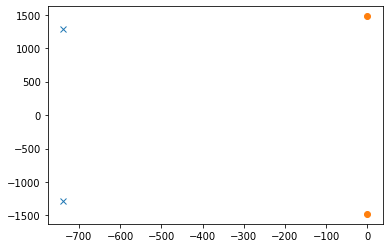

In [9]:
lib.poles_zero(transfert) #à la fréquence fondamentale

Expression de f : $$\frac{1}{2\pi\sqrt{LC}}$$

Expression de la bande rejetée (en Hz) : $$BR = 2mf_0 $$

-3dB correspond à multiplier le module en haute et basse fréquence par 0.7

Nous obtenons alors deux $\omega$ qui nous permettent de déterminer la largeur de la bande rejetée.

Expression du gain en basse et haute fréquence du filtre : Sur notre filtre nous avons : $T_{HF} = T_{BF} = 1$

### Question 8. En utilisant Python, réalisez une étude complète de ce filtre (réponse indicielle, réponse fréquentielle).

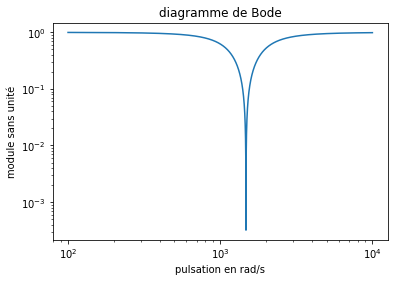

In [10]:
lib.bode(transfert) #à la fréquence fondamentale

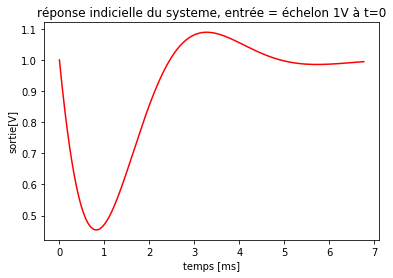

In [11]:
lib.indicielle(235, transfert) #à la fréquence fondamentale

### Question 9. Sous l’hypothèse que R = R1 = ... = RL et que le coefficient d’amortissement m est égal pour chaque étage RLC, réalisez un script python pour déterminer automatiquement les valeurs des composants Lk et Ck. Ces valeurs seront déterminées de manière à filtrer les différentes composantes fréquentielles fk (voir question 3).

### Détermination composants

In [12]:
#m=1
L,C,R = lib.compute_components()
print(L, "H")
print(C, "F")
print(R, "Ω")

0.1 H
[4.58674439304381e-06, 5.096382658937567e-07, 1.8346977572175245e-07, 1.2740956647343918e-07] F
[295.3097094374406, 885.9291283123217, 1476.5485471872028, 1771.8582566246434] Ω


In [13]:
#à décommenter si besoin
"""
from jinja2 import Environment, FileSystemLoader
file_loader = FileSystemLoader("templates")
env = Environment(loader=file_loader)
template = env.get_template("vuvuzela2.asc")
template.stream(R1v=R[0],R2v=R[1],R3v=R[2],R4v=R[3],C1v=C[0],C2v=C[1],C3v=C[2],C4v=C[3]).dump("vuvuzela2_output.asc")
"""

'\nfrom jinja2 import Environment, FileSystemLoader\nfile_loader = FileSystemLoader("templates")\nenv = Environment(loader=file_loader)\ntemplate = env.get_template("vuvuzela2.asc")\ntemplate.stream(R1v=R[0],R2v=R[1],R3v=R[2],R4v=R[3],C1v=C[0],C2v=C[1],C3v=C[2],C4v=C[3]).dump("vuvuzela2_output.asc")\n'

###  Question 11. Analysez la réponse fréquentielle du filtre cascadé.

### Analyse fréquentielle du nouveau filtre cascadé

In [14]:
AudioName = "vuvuzela_RLC.wav" # Audio File
rate, data = wavfile.read(AudioName)
ipd.Audio("vuvuzela_RLC.wav")

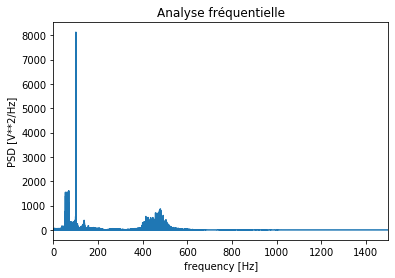

In [15]:
lib.frequentiel(rate,data)

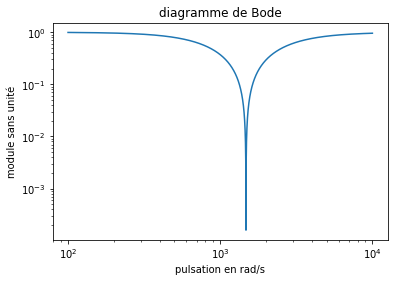

In [16]:
transfert = lib.transfert_function(235, 1, 1) #exemple à la fréquence fondamentale
lib.bode(transfert)

Nous avons bien éliminé les fréquences souhaitées.

### Question 13. — En renseignant le paramètre série résistance de la bobine, expliquez la problématique liée à ce type de filtre. Effectuer une recherche pour trouver les schémas permettant de compenser cette résistance de la branche inductive.

Nous devons modifier la valeur de la résistance série de la bobine pour notre filtre afin d'avoir un comportement qui se rapproche le plus de la réalité physique. 

## Filtre rejecteur Twin-T passif

### Question 14. Déterminez la fonction de transfert T(p) de ce filtre.

$$\frac{1+\frac{p^2}{\omega_0^2}}{1+\frac{4p}{\omega_0}+\frac{p^2}{\omega_0^2}}$$


### Question 15. Similaire aux questions 6-8.

On détermine $$\omega_0 = \frac{1}{RC}$$
Et $$m=2$$

poles : $$p_1 = \frac{-4RC - \sqrt{12R^2C^2}}{2R^2C^2}$$
        $$p_1 = \frac{-4RC + \sqrt{12R^2C^2}}{2R^2C^2}$$
zéros : $$\frac{j}{RC}$$

$$f = \frac{1}{2\pi RC}$$

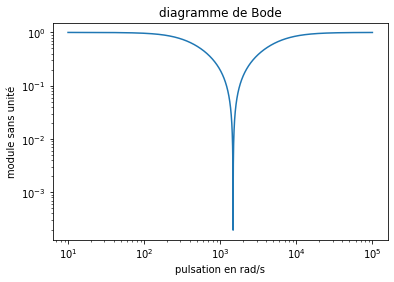

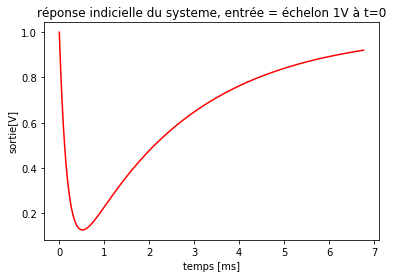

In [17]:
transfert = lib.transfert_function_twinT_passif(235) #fréquence fondamentale
lib.bode(transfert)
lib.indicielle(235, transfert)

### Question 16. Justifiez la valeur limite de m et critiquez le choix de ce filtre.

Nous observons que m ne dépend d'aucun paramètre et est toujours égal à 2, c'est donc sa valeur limite. Ce filtre n'est donc pas modulable puisque nous ne pouvons pas changer la valeur de m comme nous le voulons.

## Filtre rejecteur Twin-T actif

On détermine la fonction de transfert : $$T(p)=\frac{1+\frac{p^2}{w0^2}}{1+\frac{p}{w0*Q}+\frac{p^2}{w0^2}}$$

Et on a : $$Q=\frac{1+\frac{R4}{R5}}{4}$$

In [18]:
transfert = lib.transfert_function_twinT_actif(235, 0.3) #exemple à la fréquence fondamentale et pour Q=0.3

### Question 17

In [19]:
#Q=0.3
R,C,R4,R5 = lib.compute_components_actif()
print(R, "Ω")
print(C, "F")
print(R4, "Ω")
print(R5, "Ω")

1000 Ω
[6.772550769867887e-07, 2.2575169232892954e-07, 1.3545101539735773e-07, 1.1287584616446477e-07] F
1000 Ω
199.99999999999994 Ω


In [20]:
AudioName = "vuvuzela_Twin-T_actif.wav" # Audio File
rate, data = wavfile.read(AudioName)
ipd.Audio("vuvuzela_Twin-T_actif.wav")

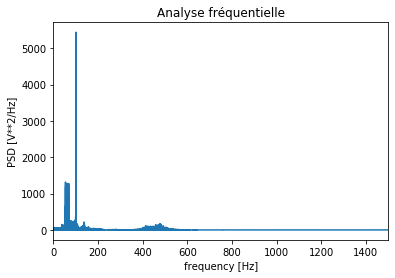

In [21]:
lib.frequentiel(rate,data)

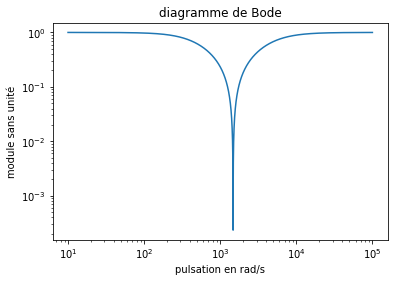

In [22]:
lib.bode(transfert)

Nous avons bien supprimé les fréquences voulues.